<a href="https://colab.research.google.com/github/DHEEPAK-RAAJ-R/PROJECTS/blob/main/SENTIMENT_ANALYSER_PROJECT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [ ]:
df=pd.read_csv('/content/Hotel_Reviews.csv')

In [ ]:
df

,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,lat,lng
0,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,8/3/2017,7.7,Hotel Arena,Russia,I am so angry that i made this post available...,397,1403,Only the park outside of the hotel was beauti...,11.0,7.0,2.9,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968
1,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,8/3/2017,7.7,Hotel Arena,Ireland,No Negative,0,1403,No real complaints the hotel was great great ...,105.0,7.0,7.5,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968
2,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,Australia,Rooms are nice but for elderly a bit difficul...,42,1403,Location was good and staff were ok It is cut...,21.0,9.0,7.1,"[' Leisure trip ', ' Family with young childre...",3 days,52.360576,4.915968
3,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,United Kingdom,My room was dirty and I was afraid to walk ba...,210,1403,Great location in nice surroundings the bar a...,26.0,1.0,3.8,"[' Leisure trip ', ' Solo traveler ', ' Duplex...",3 days,52.360576,4.915968
4,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/24/2017,7.7,Hotel Arena,New Zealand,You When I booked with your company on line y...,140,1403,Amazing location and building Romantic setting,8.0,3.0,6.7,"[' Leisure trip ', ' Couple ', ' Suite ', ' St...",10 days,52.360576,4.915968
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49675,140 Gloucester Road Kensington and Chelsea Lon...,528,1/24/2017,8.7,The Bailey s Hotel London,Portugal,People working out side of the room at 8 00AM...,22,2485,the hotel is in front of the metro station an...,16.0,1.0,7.5,"[' Leisure trip ', ' Couple ', ' Classic Doubl...",191 day,51.493873,-0.182496
49676,140 Gloucester Road Kensington and Chelsea Lon...,528,1/23/2017,8.7,The Bailey s Hotel London,United Kingdom,There was nothing to dislike,6,2485,Lovely hotel with character Next to Glouceste...,31.0,5.0,10.0,"[' Leisure trip ', ' Couple ', ' Classic Doubl...",192 day,51.493873,-0.182496
49677,140 Gloucester Road Kensington and Chelsea Lon...,528,1/22/2017,8.7,The Bailey s Hotel London,United Kingdom,The bed was on wheels and moved not ideal I a...,26,2485,We had breakfast in bed and the selection was...,20.0,1.0,9.2,"[' Leisure trip ', ' Couple ', ' Classic Doubl...",193 day,51.493873,-0.182496
49678,140 Gloucester Road Kensington and Chelsea Lon...,528,1/20/2017,8.7,The Bailey s Hotel London,United States of America,The only downside is paying 40 a day for park...,26,2485,The staff were so friendly The room was clean...,26.0,3.0,10.0,"[' Leisure trip ', ' Couple ', ' Classic Doubl...",195 day,51.493873,-0.182496


### EXPLOLATORY DATA ANALYSIS

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49680 entries, 0 to 49679
Data columns (total 17 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   Hotel_Address                               49680 non-null  object 
 1   Additional_Number_of_Scoring                49680 non-null  int64  
 2   Review_Date                                 49680 non-null  object 
 3   Average_Score                               49680 non-null  float64
 4   Hotel_Name                                  49680 non-null  object 
 5   Reviewer_Nationality                        49680 non-null  object 
 6   Negative_Review                             49680 non-null  object 
 7   Review_Total_Negative_Word_Counts           49680 non-null  int64  
 8   Total_Number_of_Reviews                     49680 non-null  int64  
 9   Positive_Review                             49680 non-null  object 
 10  Review_Tot

In [ ]:
df.isnull().sum()

Hotel_Address                                 0
Additional_Number_of_Scoring                  0
Review_Date                                   0
Average_Score                                 0
Hotel_Name                                    0
Reviewer_Nationality                          0
Negative_Review                               0
Review_Total_Negative_Word_Counts             0
Total_Number_of_Reviews                       0
Positive_Review                               0
Review_Total_Positive_Word_Counts             1
Total_Number_of_Reviews_Reviewer_Has_Given    1
Reviewer_Score                                1
Tags                                          1
days_since_review                             1
lat                                           1
lng                                           1
dtype: int64

In [ ]:
df.describe()

,Additional_Number_of_Scoring,Average_Score,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,lat,lng
count,49680.000000,49680.000000,49680.000000,49680.000000,49679.000000,49679.000000,49679.000000,49679.000000,49679.000000
mean,537.930636,8.440471,18.372826,2392.456602,17.643854,6.439743,8.448397,51.018586,0.372912
std,411.013315,0.512698,29.114891,1740.899252,21.066532,10.116541,1.605391,1.042101,1.049329
min,6.000000,7.100000,0.000000,49.000000,0.000000,1.000000,2.500000,48.817808,-0.275622
25%,194.000000,8.000000,2.000000,1073.000000,6.000000,1.000000,7.500000,51.492514,-0.178061
50%,421.000000,8.400000,9.000000,2130.000000,11.000000,3.000000,8.800000,51.510654,-0.125160
75%,728.000000,8.800000,24.000000,3150.000000,22.000000,7.000000,9.600000,51.516675,-0.007271
max,1322.000000,9.600000,397.000000,6539.000000,383.000000,315.000000,10.000000,52.360576,4.915968


In [ ]:
df.shape

(49680, 17)

In [ ]:
df.columns

Index(['Hotel_Address', 'Additional_Number_of_Scoring', 'Review_Date',
       'Average_Score', 'Hotel_Name', 'Reviewer_Nationality',
       'Negative_Review', 'Review_Total_Negative_Word_Counts',
       'Total_Number_of_Reviews', 'Positive_Review',
       'Review_Total_Positive_Word_Counts',
       'Total_Number_of_Reviews_Reviewer_Has_Given', 'Reviewer_Score', 'Tags',
       'days_since_review', 'lat', 'lng'],
      dtype='object')

### DATA VISUALIZATION

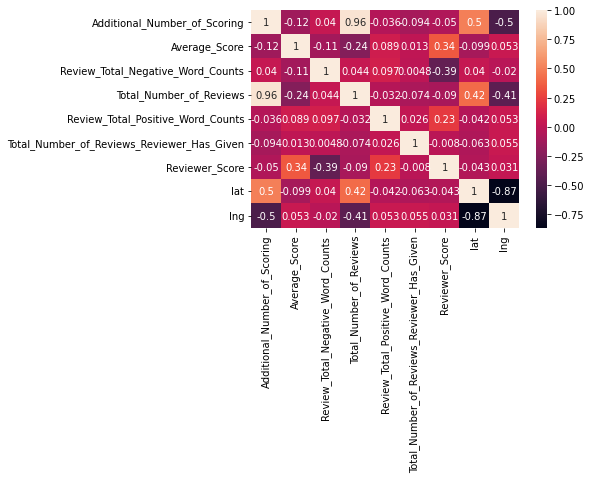

In [ ]:
corr=df.corr()
sns.heatmap(corr,annot=True)
#fint the correlation between attributes

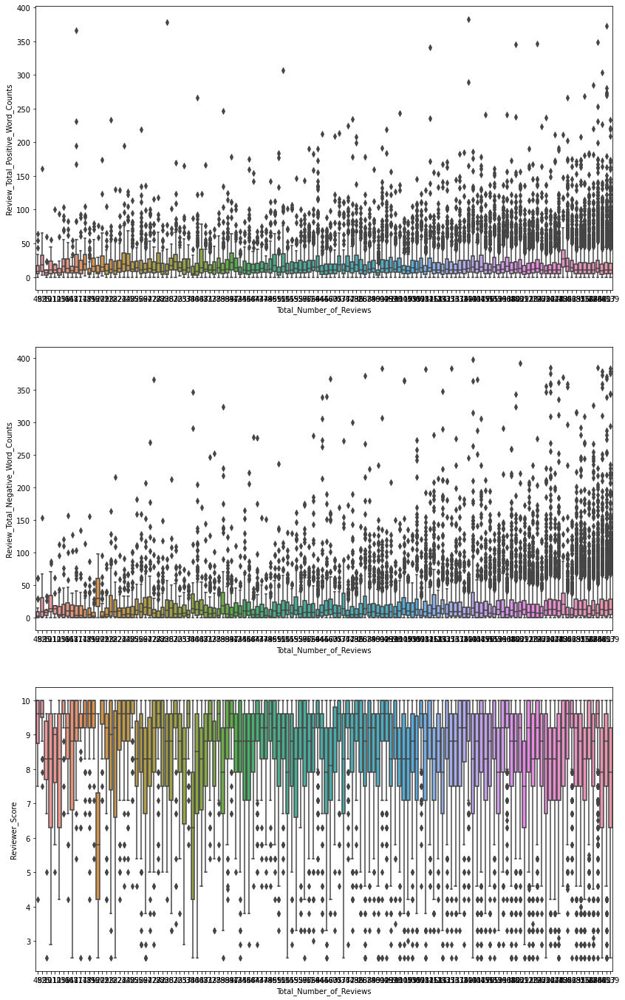

In [ ]:
plt.subplots(figsize = (14,24))
plt.subplot(3,1,1)
sns.boxplot(x=df['Total_Number_of_Reviews'],y=df['Review_Total_Positive_Word_Counts'])
plt.subplot(3,1,2)
sns.boxplot(x=df['Total_Number_of_Reviews'],y=df['Review_Total_Negative_Word_Counts'])
plt.subplot(3,1,3)
sns.boxplot(x=df['Total_Number_of_Reviews'],y=df['Reviewer_Score'])

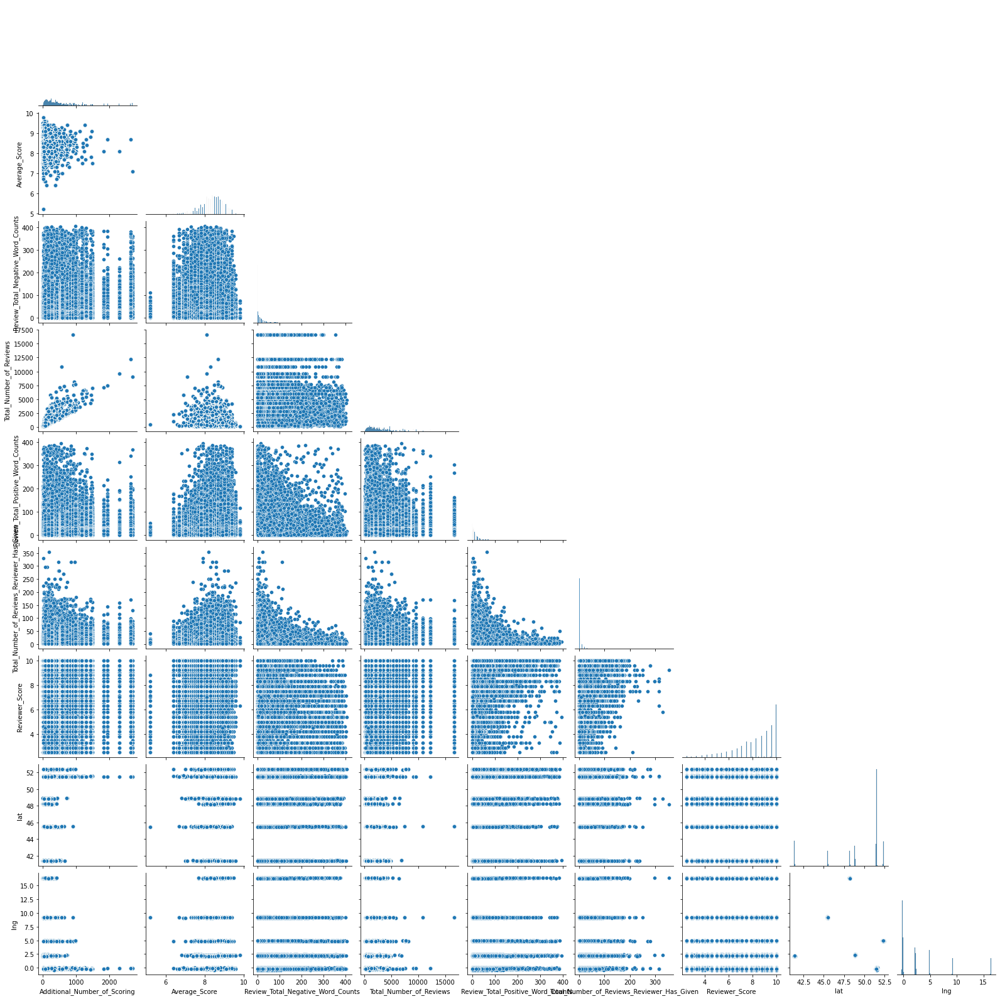

In [ ]:
sns.pairplot(df,corner=True)

<AxesSubplot:>

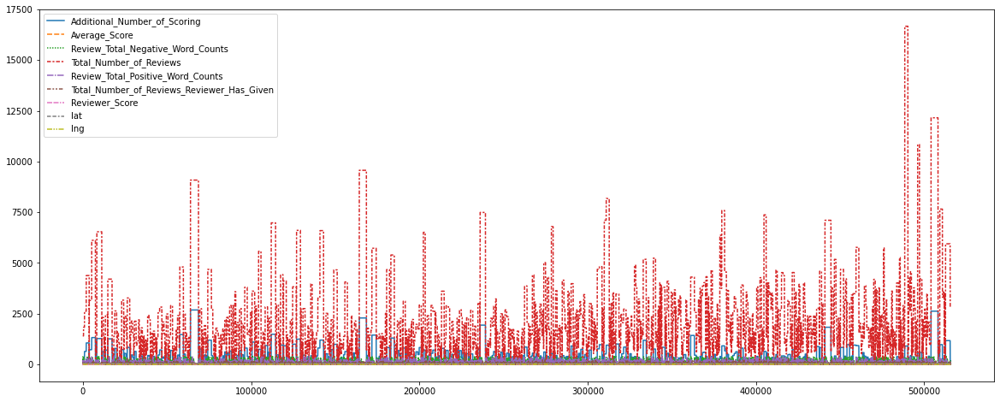

In [ ]:
plt.figure(figsize=(20,8))
sns.lineplot(data=df)

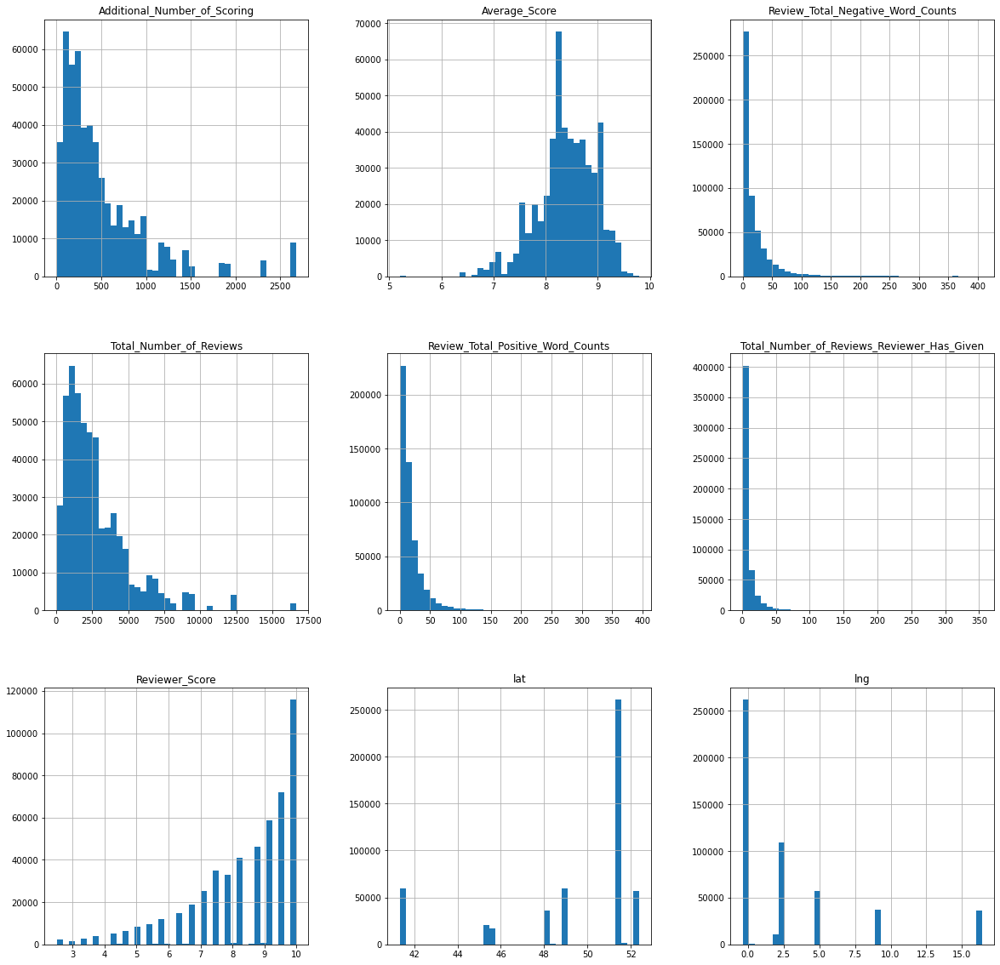

In [ ]:
df.hist(bins=40, figsize=(20,20))
plt.show()

### FEATURE ENGINEERING

In [ ]:
df["review"] = df["Negative_Review"] + df["Positive_Review"]
#combing the positive and negative reviews to form a single review(in a new column)

In [ ]:
df

,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,lat,lng,review
0,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,08-03-2017,7.7,Hotel Arena,Russia,I am so angry that i made this post available...,397,1403,Only the park outside of the hotel was beauti...,11,7,2.9,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968,I am so angry that i made this post available...
1,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,08-03-2017,7.7,Hotel Arena,Ireland,No Negative,0,1403,No real complaints the hotel was great great ...,105,7,7.5,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968,No Negative No real complaints the hotel was g...
2,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,Australia,Rooms are nice but for elderly a bit difficul...,42,1403,Location was good and staff were ok It is cut...,21,9,7.1,"[' Leisure trip ', ' Family with young childre...",3 days,52.360576,4.915968,Rooms are nice but for elderly a bit difficul...
3,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,United Kingdom,My room was dirty and I was afraid to walk ba...,210,1403,Great location in nice surroundings the bar a...,26,1,3.8,"[' Leisure trip ', ' Solo traveler ', ' Duplex...",3 days,52.360576,4.915968,My room was dirty and I was afraid to walk ba...
4,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/24/2017,7.7,Hotel Arena,New Zealand,You When I booked with your company on line y...,140,1403,Amazing location and building Romantic setting,8,3,6.7,"[' Leisure trip ', ' Couple ', ' Suite ', ' St...",10 days,52.360576,4.915968,You When I booked with your company on line y...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
515733,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,168,8/30/2015,8.1,Atlantis Hotel Vienna,Kuwait,no trolly or staff to help you take the lugga...,14,2823,location,2,8,7.0,"[' Leisure trip ', ' Family with older childre...",704 day,48.203745,16.335677,no trolly or staff to help you take the lugga...
515734,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,168,8/22/2015,8.1,Atlantis Hotel Vienna,Estonia,The hotel looks like 3 but surely not 4,11,2823,Breakfast was ok and we got earlier check in,11,12,5.8,"[' Leisure trip ', ' Family with young childre...",712 day,48.203745,16.335677,The hotel looks like 3 but surely not 4 Brea...
515735,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,168,8/19/2015,8.1,Atlantis Hotel Vienna,Egypt,The ac was useless It was a hot week in vienn...,19,2823,No Positive,0,3,2.5,"[' Leisure trip ', ' Family with older childre...",715 day,48.203745,16.335677,The ac was useless It was a hot week in vienn...
515736,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,168,8/17/2015,8.1,Atlantis Hotel Vienna,Mexico,No Negative,0,2823,The rooms are enormous and really comfortable...,25,3,8.8,"[' Leisure trip ', ' Group ', ' Standard Tripl...",717 day,48.203745,16.335677,No Negative The rooms are enormous and really ...


In [ ]:
df1 = df.iloc[:,17:18]
df1

,review
0,I am so angry that i made this post available...
1,No Negative No real complaints the hotel was g...
2,Rooms are nice but for elderly a bit difficul...
3,My room was dirty and I was afraid to walk ba...
4,You When I booked with your company on line y...
...,...
49675,People working out side of the room at 8 00AM...
49676,There was nothing to dislike Lovely hotel wit...
49677,The bed was on wheels and moved not ideal I a...
49678,The only downside is paying 40 a day for park...


In [ ]:
sentiment_array=np.array(df1)
sentiment_array

array([[' I am so angry that i made this post available via all possible sites i use when planing my trips so no one will make the mistake of booking this place I made my booking via booking com We stayed for 6 nights in this hotel from 11 to 17 July Upon arrival we were placed in a small room on the 2nd floor of the hotel It turned out that this was not the room we booked I had specially reserved the 2 level duplex room so that we would have a big windows and high ceilings The room itself was ok if you don t mind the broken window that can not be closed hello rain and a mini fridge that contained some sort of a bio weapon at least i guessed so by the smell of it I intimately asked to change the room and after explaining 2 times that i booked a duplex btw it costs the same as a simple double but got way more volume due to the high ceiling was offered a room but only the next day SO i had to check out the next day before 11 o clock in order to get the room i waned to Not the best way to

In [ ]:
import nltk
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer


In [ ]:
sent_analyzer = SentimentIntensityAnalyzer()
sentiment_score=[]
for i in range(0,515738):
    x=sent_analyzer.polarity_scores(sentiment_array[i-1])
    sentiment_score.append(x['compound'])

In [ ]:
print(sentiment_score)

[0.7902, -0.8649, 0.9697, 0.9019, 0.9355, 0.5263, 0.9247, 0.9337, 0.9491, 0.5076, 0.8221, 0.9788, -0.8979, 0.0, 0.9682, 0.584, 0.9961, 0.928, 0.9842, 0.5717, 0.8957, 0.4019, -0.8439, -0.3255, 0.9842, 0.9732, 0.9761, 0.9975, 0.8885, 0.8883, 0.9604, 0.9284, 0.894, -0.511, 0.7287, 0.926, 0.979, -0.6501, 0.2229, 0.9945, 0.6709, 0.9457, 0.9741, -0.5523, 0.7669, -0.5719, 0.9091, 0.9795, 0.9779, 0.9535, -0.3421, 0.8526, 0.1531, 0.9744, 0.961, 0.743, 0.9778, 0.3999, 0.976, 0.8977, 0.9907, 0.8591, 0.4927, 0.9786, -0.0498, 0.9272, 0.4391, 0.813, 0.9774, 0.9552, 0.9642, 0.9547, 0.8737, 0.25, 0.9679, 0.9224, 0.9523, 0.92, 0.8591, 0.9759, 0.9432, 0.926, 0.9601, 0.9517, 0.9422, 0.5221, 0.9833, 0.9281, -0.6247, 0.6258, -0.5431, -0.8777, 0.4019, -0.7096, 0.4931, 0.7351, 0.9963, 0.9118, 0.9022, -0.9173, 0.8589, -0.6124, 0.7096, 0.9595, 0.9831, 0.9676, 0.5717, 0.9545, -0.7298, 0.8685, 0.7269, 0.836, 0.7197, 0.8607, 0.9547, 0.9564, 0.8737, 0.7964, 0.9826, 0.9627, 0.4917, 0.7237, -0.0951, 0.3814, 0.9856, 

In [ ]:
sentiment=pd.DataFrame(sentiment_score)
sentiment.describe()

,0
count,515738.000000
mean,0.516632
std,0.489961
min,-0.997500
25%,0.256225
50%,0.718400
75%,0.900200
max,0.999400


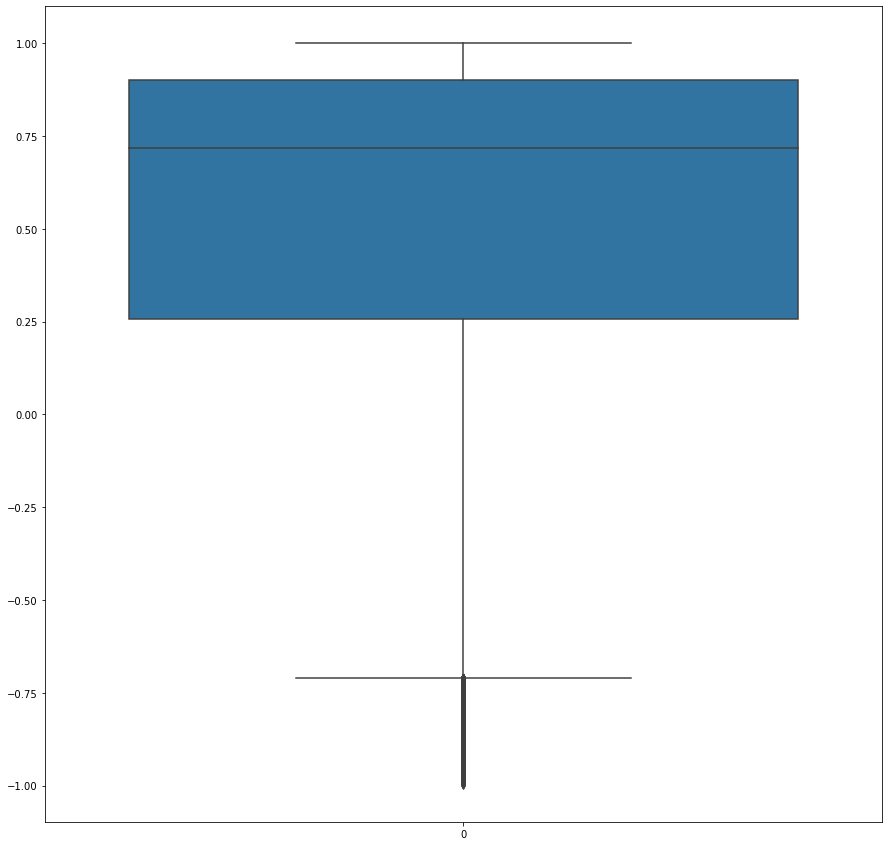

In [ ]:
plt.figure(figsize=(15,15))
sns.boxplot(data=sentiment)
plt.show()

In [ ]:
df_final =  pd.concat([df, sentiment], axis=1, join='inner')

In [ ]:
df_final

,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,lat,lng,review,0
0,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,08-03-2017,7.7,Hotel Arena,Russia,I am so angry that i made this post available...,397,1403,Only the park outside of the hotel was beauti...,11,7,2.9,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968,I am so angry that i made this post available...,0.7902
1,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,08-03-2017,7.7,Hotel Arena,Ireland,No Negative,0,1403,No real complaints the hotel was great great ...,105,7,7.5,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968,No Negative No real complaints the hotel was g...,-0.8649
2,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,Australia,Rooms are nice but for elderly a bit difficul...,42,1403,Location was good and staff were ok It is cut...,21,9,7.1,"[' Leisure trip ', ' Family with young childre...",3 days,52.360576,4.915968,Rooms are nice but for elderly a bit difficul...,0.9697
3,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,United Kingdom,My room was dirty and I was afraid to walk ba...,210,1403,Great location in nice surroundings the bar a...,26,1,3.8,"[' Leisure trip ', ' Solo traveler ', ' Duplex...",3 days,52.360576,4.915968,My room was dirty and I was afraid to walk ba...,0.9019
4,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/24/2017,7.7,Hotel Arena,New Zealand,You When I booked with your company on line y...,140,1403,Amazing location and building Romantic setting,8,3,6.7,"[' Leisure trip ', ' Couple ', ' Suite ', ' St...",10 days,52.360576,4.915968,You When I booked with your company on line y...,0.9355
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
515733,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,168,8/30/2015,8.1,Atlantis Hotel Vienna,Kuwait,no trolly or staff to help you take the lugga...,14,2823,location,2,8,7.0,"[' Leisure trip ', ' Family with older childre...",704 day,48.203745,16.335677,no trolly or staff to help you take the lugga...,0.1695
515734,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,168,8/22/2015,8.1,Atlantis Hotel Vienna,Estonia,The hotel looks like 3 but surely not 4,11,2823,Breakfast was ok and we got earlier check in,11,12,5.8,"[' Leisure trip ', ' Family with young childre...",712 day,48.203745,16.335677,The hotel looks like 3 but surely not 4 Brea...,0.1280
515735,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,168,8/19/2015,8.1,Atlantis Hotel Vienna,Egypt,The ac was useless It was a hot week in vienn...,19,2823,No Positive,0,3,2.5,"[' Leisure trip ', ' Family with older childre...",715 day,48.203745,16.335677,The ac was useless It was a hot week in vienn...,0.8126
515736,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,168,8/17/2015,8.1,Atlantis Hotel Vienna,Mexico,No Negative,0,2823,The rooms are enormous and really comfortable...,25,3,8.8,"[' Leisure trip ', ' Group ', ' Standard Tripl...",717 day,48.203745,16.335677,No Negative The rooms are enormous and really ...,0.2648


In [ ]:
new_data_sentiment=df_final.rename(columns={0: "Sentiment_score"})

In [ ]:
new_data_sentiment

,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,lat,lng,review,Sentiment_score
0,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,08-03-2017,7.7,Hotel Arena,Russia,I am so angry that i made this post available...,397,1403,Only the park outside of the hotel was beauti...,11,7,2.9,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968,I am so angry that i made this post available...,0.7902
1,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,08-03-2017,7.7,Hotel Arena,Ireland,No Negative,0,1403,No real complaints the hotel was great great ...,105,7,7.5,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968,No Negative No real complaints the hotel was g...,-0.8649
2,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,Australia,Rooms are nice but for elderly a bit difficul...,42,1403,Location was good and staff were ok It is cut...,21,9,7.1,"[' Leisure trip ', ' Family with young childre...",3 days,52.360576,4.915968,Rooms are nice but for elderly a bit difficul...,0.9697
3,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,United Kingdom,My room was dirty and I was afraid to walk ba...,210,1403,Great location in nice surroundings the bar a...,26,1,3.8,"[' Leisure trip ', ' Solo traveler ', ' Duplex...",3 days,52.360576,4.915968,My room was dirty and I was afraid to walk ba...,0.9019
4,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/24/2017,7.7,Hotel Arena,New Zealand,You When I booked with your company on line y...,140,1403,Amazing location and building Romantic setting,8,3,6.7,"[' Leisure trip ', ' Couple ', ' Suite ', ' St...",10 days,52.360576,4.915968,You When I booked with your company on line y...,0.9355
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
515733,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,168,8/30/2015,8.1,Atlantis Hotel Vienna,Kuwait,no trolly or staff to help you take the lugga...,14,2823,location,2,8,7.0,"[' Leisure trip ', ' Family with older childre...",704 day,48.203745,16.335677,no trolly or staff to help you take the lugga...,0.1695
515734,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,168,8/22/2015,8.1,Atlantis Hotel Vienna,Estonia,The hotel looks like 3 but surely not 4,11,2823,Breakfast was ok and we got earlier check in,11,12,5.8,"[' Leisure trip ', ' Family with young childre...",712 day,48.203745,16.335677,The hotel looks like 3 but surely not 4 Brea...,0.1280
515735,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,168,8/19/2015,8.1,Atlantis Hotel Vienna,Egypt,The ac was useless It was a hot week in vienn...,19,2823,No Positive,0,3,2.5,"[' Leisure trip ', ' Family with older childre...",715 day,48.203745,16.335677,The ac was useless It was a hot week in vienn...,0.8126
515736,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,168,8/17/2015,8.1,Atlantis Hotel Vienna,Mexico,No Negative,0,2823,The rooms are enormous and really comfortable...,25,3,8.8,"[' Leisure trip ', ' Group ', ' Standard Tripl...",717 day,48.203745,16.335677,No Negative The rooms are enormous and really ...,0.2648


In [ ]:
new_data_sentiment.columns

Index(['Hotel_Address', 'Additional_Number_of_Scoring', 'Review_Date',
       'Average_Score', 'Hotel_Name', 'Reviewer_Nationality',
       'Negative_Review', 'Review_Total_Negative_Word_Counts',
       'Total_Number_of_Reviews', 'Positive_Review',
       'Review_Total_Positive_Word_Counts',
       'Total_Number_of_Reviews_Reviewer_Has_Given', 'Reviewer_Score', 'Tags',
       'days_since_review', 'lat', 'lng', 'review', 'Sentiment_score'],
      dtype='object')

In [ ]:
sent=np.array(new_data_sentiment['Sentiment_score'])
sent

array([ 0.7902, -0.8649,  0.9697, ...,  0.8126,  0.2648,  0.7817])

conditions for lables:
-0.25 --- .25 avg
-.75 --- -.25 bad
<-.75 aweful
.25 --- .75 gud
->.75 excellent

In [ ]:
cust_sentiment=[]
for i in range(0,515738):
    if(sent[i]>0.75):
        cust_sentiment.append("Excellent")
    elif(sent[i]>=.25):
        cust_sentiment.append("Good")
    elif(sent[i]>=-0.25):
        cust_sentiment.append("Average")
    elif(sent[i]>=-0.75):
        cust_sentiment.append("Bad")
    else:
        cust_sentiment.append("Awful")
    

In [ ]:
print(cust_sentiment)

['Excellent', 'Awful', 'Excellent', 'Excellent', 'Excellent', 'Good', 'Excellent', 'Excellent', 'Excellent', 'Good', 'Excellent', 'Excellent', 'Awful', 'Average', 'Excellent', 'Good', 'Excellent', 'Excellent', 'Excellent', 'Good', 'Excellent', 'Good', 'Awful', 'Bad', 'Excellent', 'Excellent', 'Excellent', 'Excellent', 'Excellent', 'Excellent', 'Excellent', 'Excellent', 'Excellent', 'Bad', 'Good', 'Excellent', 'Excellent', 'Bad', 'Average', 'Excellent', 'Good', 'Excellent', 'Excellent', 'Bad', 'Excellent', 'Bad', 'Excellent', 'Excellent', 'Excellent', 'Excellent', 'Bad', 'Excellent', 'Average', 'Excellent', 'Excellent', 'Good', 'Excellent', 'Good', 'Excellent', 'Excellent', 'Excellent', 'Excellent', 'Good', 'Excellent', 'Average', 'Excellent', 'Good', 'Excellent', 'Excellent', 'Excellent', 'Excellent', 'Excellent', 'Excellent', 'Good', 'Excellent', 'Excellent', 'Excellent', 'Excellent', 'Excellent', 'Excellent', 'Excellent', 'Excellent', 'Excellent', 'Excellent', 'Excellent', 'Good', 'E

In [ ]:
customer=pd.DataFrame(cust_sentiment)

In [ ]:
sent_analyser=pd.concat([new_data_sentiment, customer], axis=1, join='inner')

In [ ]:
sent_analyser=sent_analyser.rename(columns={0: "Customer_sentiment"})
sent_analyser

,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,lat,lng,review,Sentiment_score,Customer_sentiment
0,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,08-03-2017,7.7,Hotel Arena,Russia,I am so angry that i made this post available...,397,1403,Only the park outside of the hotel was beauti...,11,7,2.9,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968,I am so angry that i made this post available...,0.7902,Excellent
1,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,08-03-2017,7.7,Hotel Arena,Ireland,No Negative,0,1403,No real complaints the hotel was great great ...,105,7,7.5,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968,No Negative No real complaints the hotel was g...,-0.8649,Awful
2,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,Australia,Rooms are nice but for elderly a bit difficul...,42,1403,Location was good and staff were ok It is cut...,21,9,7.1,"[' Leisure trip ', ' Family with young childre...",3 days,52.360576,4.915968,Rooms are nice but for elderly a bit difficul...,0.9697,Excellent
3,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,United Kingdom,My room was dirty and I was afraid to walk ba...,210,1403,Great location in nice surroundings the bar a...,26,1,3.8,"[' Leisure trip ', ' Solo traveler ', ' Duplex...",3 days,52.360576,4.915968,My room was dirty and I was afraid to walk ba...,0.9019,Excellent
4,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/24/2017,7.7,Hotel Arena,New Zealand,You When I booked with your company on line y...,140,1403,Amazing location and building Romantic setting,8,3,6.7,"[' Leisure trip ', ' Couple ', ' Suite ', ' St...",10 days,52.360576,4.915968,You When I booked with your company on line y...,0.9355,Excellent
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
515733,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,168,8/30/2015,8.1,Atlantis Hotel Vienna,Kuwait,no trolly or staff to help you take the lugga...,14,2823,location,2,8,7.0,"[' Leisure trip ', ' Family with older childre...",704 day,48.203745,16.335677,no trolly or staff to help you take the lugga...,0.1695,Average
515734,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,168,8/22/2015,8.1,Atlantis Hotel Vienna,Estonia,The hotel looks like 3 but surely not 4,11,2823,Breakfast was ok and we got earlier check in,11,12,5.8,"[' Leisure trip ', ' Family with young childre...",712 day,48.203745,16.335677,The hotel looks like 3 but surely not 4 Brea...,0.1280,Average
515735,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,168,8/19/2015,8.1,Atlantis Hotel Vienna,Egypt,The ac was useless It was a hot week in vienn...,19,2823,No Positive,0,3,2.5,"[' Leisure trip ', ' Family with older childre...",715 day,48.203745,16.335677,The ac was useless It was a hot week in vienn...,0.8126,Excellent
515736,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,168,8/17/2015,8.1,Atlantis Hotel Vienna,Mexico,No Negative,0,2823,The rooms are enormous and really comfortable...,25,3,8.8,"[' Leisure trip ', ' Group ', ' Standard Tripl...",717 day,48.203745,16.335677,No Negative The rooms are enormous and really ...,0.2648,Good


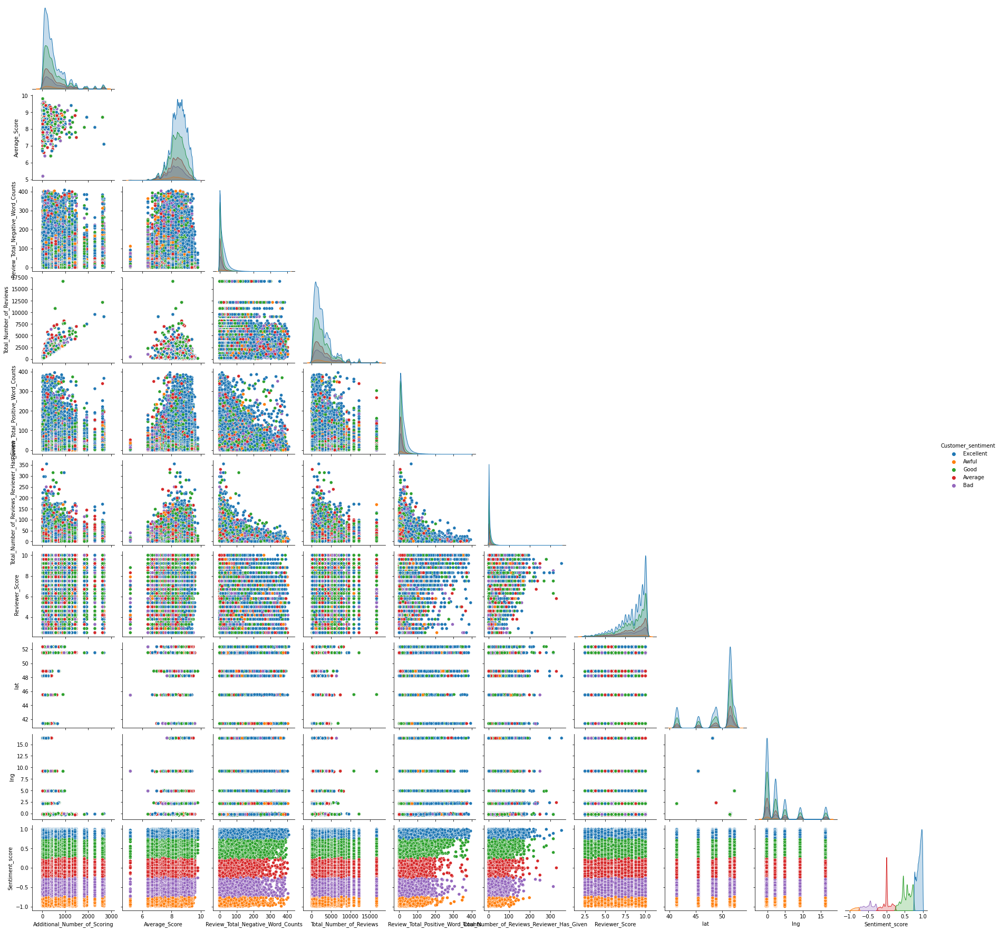

In [ ]:
sns.pairplot(data=sent_analyser,hue='Customer_sentiment',corner=True)

In [ ]:
sent_analyser=sent_analyser.drop(columns=["Additional_Number_of_Scoring","Reviewer_Nationality","Negative_Review","Review_Total_Negative_Word_Counts","Positive_Review","Review_Total_Positive_Word_Counts","Tags","days_since_review","lat","lng"])

In [ ]:
sent_analyser=sent_analyser.drop(columns=["Review_Date","Total_Number_of_Reviews_Reviewer_Has_Given"])

In [ ]:
sent_analyser

,Hotel_Address,Average_Score,Hotel_Name,Total_Number_of_Reviews,Reviewer_Score,review,Sentiment_score,Customer_sentiment
0,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,7.7,Hotel Arena,1403,2.9,I am so angry that i made this post available...,0.7902,Excellent
1,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,7.7,Hotel Arena,1403,7.5,No Negative No real complaints the hotel was g...,-0.8649,Awful
2,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,7.7,Hotel Arena,1403,7.1,Rooms are nice but for elderly a bit difficul...,0.9697,Excellent
3,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,7.7,Hotel Arena,1403,3.8,My room was dirty and I was afraid to walk ba...,0.9019,Excellent
4,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,7.7,Hotel Arena,1403,6.7,You When I booked with your company on line y...,0.9355,Excellent
...,...,...,...,...,...,...,...,...
515733,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,8.1,Atlantis Hotel Vienna,2823,7.0,no trolly or staff to help you take the lugga...,0.1695,Average
515734,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,8.1,Atlantis Hotel Vienna,2823,5.8,The hotel looks like 3 but surely not 4 Brea...,0.1280,Average
515735,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,8.1,Atlantis Hotel Vienna,2823,2.5,The ac was useless It was a hot week in vienn...,0.8126,Excellent
515736,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,8.1,Atlantis Hotel Vienna,2823,8.8,No Negative The rooms are enormous and really ...,0.2648,Good


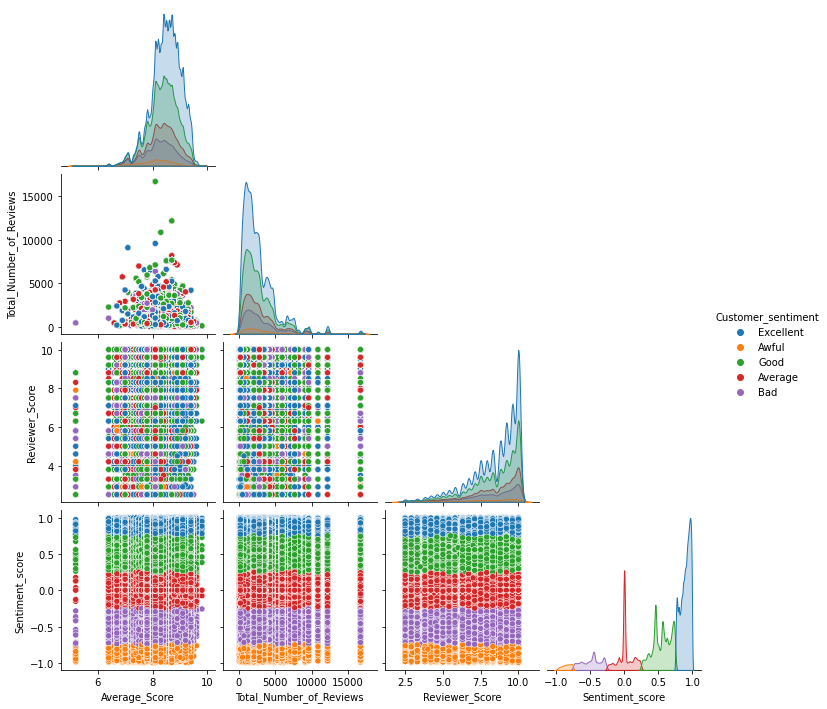

In [ ]:
sns.pairplot(sent_analyser,hue="Customer_sentiment",corner=True)

In [ ]:
from sklearn.model_selection import train_test_split
X=sent_analyser[['Average_Score','Reviewer_Score','Sentiment_score']]
y=sent_analyser['Customer_sentiment']
X_train, X_test, y_train, y_test = train_test_split(X, y,train_size=0.7, random_state = 0)

from sklearn.svm import SVC
svm_model = SVC(gamma='auto').fit(X_train, y_train)
svm_predictions = svm_model.predict(X_test)

acc_train = svm_model.score(X_train, y_train)
acc_test = svm_model.score(X_test, y_test)
print(acc_train,"accuracy for train")
print(acc_test,"accuracy for test")

0.9958035100937355 accuracy for train
0.9956761158723387 accuracy for test


In [ ]:
svm=pd.DataFrame(svm_predictions)

In [ ]:
sent_analyser['Customer_sentiment']

0         Excellent
1             Awful
2         Excellent
3         Excellent
4         Excellent
            ...    
515733      Average
515734      Average
515735    Excellent
515736         Good
515737    Excellent
Name: Customer_sentiment, Length: 515738, dtype: object

In [ ]:
svm

,0
0,Good
1,Excellent
2,Excellent
3,Excellent
4,Good
...,...
154717,Excellent
154718,Bad
154719,Awful
154720,Excellent
